2023/09/11_Looking at trying to set up the environment from scratch


In [1]:
# Import dependencies
import numpy as np
from cellpose_omni import models, core

# This checks to see if you have set up your GPU properly.
# CPU performance is a lot slower, but not a problem if you 
# are only processing a few images.
use_GPU = core.use_gpu()
print('>>> GPU activated? {}'.format(use_GPU))

# for plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
mpl.rcParams['figure.dpi'] = 300
plt.style.use('dark_background')


c:\Users\MicrobeJ\anaconda3\envs\omnipose_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2023-10-09 11:40:24,011 [INFO] TORCH GPU version not installed/working.
>>> GPU activated? False


Now that I have everything set up I need to load my images, which can be done in a variety of ways but here we will save them as variable "files" by importing a path and then matching file names with extensions and keywords



Original image shape: (3, 512, 512)
data type: uint16
data range: min 1161, max 39445

Original image shape: (3, 512, 512)
data type: uint16
data range: min 1130, max 30580


number of images: 2


new shape:  (512, 512)
new shape:  (512, 512)


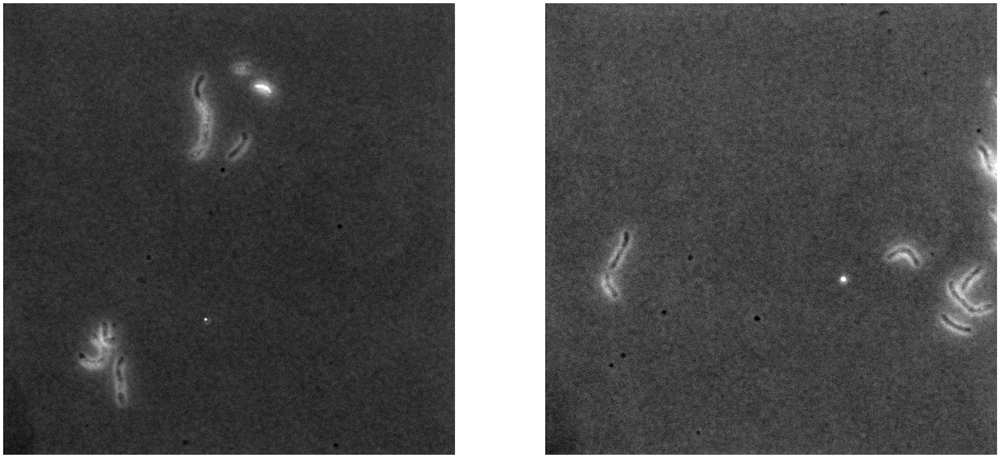

In [4]:
from pathlib import Path

basedir = r'C://Users//MicrobeJ//Downloads//omnipose_multichannel//images'
files = [str(p) for p in Path(basedir).glob("MAX*")]

from cellpose_omni import io, transforms
from omnipose.utils import normalize99
imgs = [io.imread(f) for f in files]

# print some info about the images.
for i in imgs:
    print('Original image shape:',i.shape)
    print('data type:',i.dtype)
    print('data range: min {}, max {}\n'.format(i.min(),i.max()))
nimg = len(imgs)
print('\nnumber of images:',nimg)

fig = plt.figure(figsize=[40]*2,frameon=False) # initialize figure
print('\n')
for k in range(len(imgs)):
    img = transforms.move_min_dim(imgs[k]) # move the channel dimension last
    if len(img.shape)>2:
        # imgs[k] = img[:,:,1] # could pick out a specific channel
        imgs[k] = np.mean(img,axis=-1) # or just turn into grayscale 
        
    imgs[k] = normalize99(imgs[k])
    # imgs[k] = np.pad(imgs[k],10,'edge')
    print('new shape: ', imgs[k].shape)
    plt.subplot(1,len(files),k+1)
    plt.imshow(imgs[k],cmap='gray')
    plt.axis('off')

## Decide Which Model to use
Here we will list the models and choose which model to use. I am assuming we will almost always use the bact_phase_omni or bact_phase_cp models


In [11]:
from skimage.io import imread, imsave
import numpy as np
from pathlib import Path
from cellpose_omni import models, utils, io as cellpose_io  # renamed io to avoid conflict
import time
from skimage.morphology import dilation, square

# Initialize model
model_name = 'bact_phase_omni'
model = models.CellposeModel(gpu=False, model_type=model_name)

# Parameters
chans = [0,0]  # Segment based on first channel, no second channel
n = range(len(files))  # Segment all images
mask_threshold = -1
flow_threshold = 0
niter = None
omni = True
cluster = True
resample = True
verbose = 0
affinity_seg = 0

# Run segmentation
tic = time.time()
masks, flows, styles = model.eval(
    [imread(f)[..., 0] for f in files],  # Reading only the first channel for segmentation
    channels=chans,
    mask_threshold=mask_threshold,
    flow_threshold=flow_threshold,
    niter=niter,
    omni=omni,
    cluster=cluster,
    resample=resample,
    verbose=verbose,
    affinity_seg=affinity_seg
)
net_time = time.time() - tic
print(f'total segmentation time: {net_time}s')



2023-10-09 11:48:46,405 [INFO] >>bact_phase_omni<< model set to be used
2023-10-09 11:48:46,407 [INFO] >>>> using CPU


2023-10-09 11:48:56,257 [INFO] 100%|##########| 2/2 [00:09<00:00,  4.78s/it]
total segmentation time: 9.56458306312561s


In [14]:
# Apply masks and save images
for idx, mask in enumerate(masks):
    original_image = imread(files[idx])  # Read the original multi-channel image
    
    if original_image.shape[:2] != mask.shape:
        print(f"Dimension mismatch for {files[idx]}")
        continue
    
    # Extend mask dimensions to match the multi-channel image
    mask_multi_channel = np.repeat(mask[:, :, np.newaxis], original_image.shape[2], axis=2)
    
    # Apply the mask to isolate the cells in all channels
    masked_image = original_image * (mask_multi_channel > 0)
    
    # Save masked image and other outputs
    filename = Path(files[idx]).name
    base_name = Path(filename).stem
    imsave(f"{basedir}/{base_name}_masked.tif", masked_image.astype(np.uint16))
    
    # Generate and save outlines
    outlines = utils.outlines_list(mask)
    cellpose_io.outlines_to_text(f"{basedir}/{base_name}_outlines.txt", outlines)
    imsave(f"{basedir}/{base_name}_mask.tif", mask.astype(np.uint16))
    
    # Dilate the mask slightly to ensure complete background isolation
    dilated_mask_multi_channel = np.repeat(dilation(mask, square(3))[:, :, np.newaxis], original_image.shape[2], axis=2)
    
    # Isolate the background by applying the dilated mask across all channels
    background = np.where(dilated_mask_multi_channel > 0, 0, original_image)
    
    # Save the isolated background image for all channels
    imsave(f"{basedir}/{base_name}_background.tif", background.astype(np.uint16))
    
    # Calculate metrics for background analysis (using the first channel as an example)
    background_first_channel = background[..., 0]
    max_intensity = np.max(background_first_channel)
    min_intensity = np.min(background_first_channel)
    avg_intensity = np.mean(background_first_channel)
    
    print(f"Background metrics for {base_name}: Max = {max_intensity}, Min = {min_intensity}, Avg = {avg_intensity}")


Background metrics for MAX.tif - T=0: Max = 39445, Min = 0, Avg = 22452.489143371582
Background metrics for MAX.tif - T=1: Max = 28497, Min = 0, Avg = 22506.752208709717


C:\Users\MicrobeJ\AppData\Local\Temp\ipykernel_24444\941785136.py:18: UserWarning: C://Users//MicrobeJ//Downloads//omnipose_multichannel//images/MAX.tif - T=0_masked.tif is a low contrast image
  imsave(f"{basedir}/{base_name}_masked.tif", masked_image.astype(np.uint16))
C:\Users\MicrobeJ\AppData\Local\Temp\ipykernel_24444\941785136.py:23: UserWarning: C://Users//MicrobeJ//Downloads//omnipose_multichannel//images/MAX.tif - T=0_mask.tif is a low contrast image
  imsave(f"{basedir}/{base_name}_mask.tif", mask.astype(np.uint16))
C:\Users\MicrobeJ\AppData\Local\Temp\ipykernel_24444\941785136.py:18: UserWarning: C://Users//MicrobeJ//Downloads//omnipose_multichannel//images/MAX.tif - T=1_masked.tif is a low contrast image
  imsave(f"{basedir}/{base_name}_masked.tif", masked_image.astype(np.uint16))
C:\Users\MicrobeJ\AppData\Local\Temp\ipykernel_24444\941785136.py:23: UserWarning: C://Users//MicrobeJ//Downloads//omnipose_multichannel//images/MAX.tif - T=1_mask.tif is a low contrast image
  im

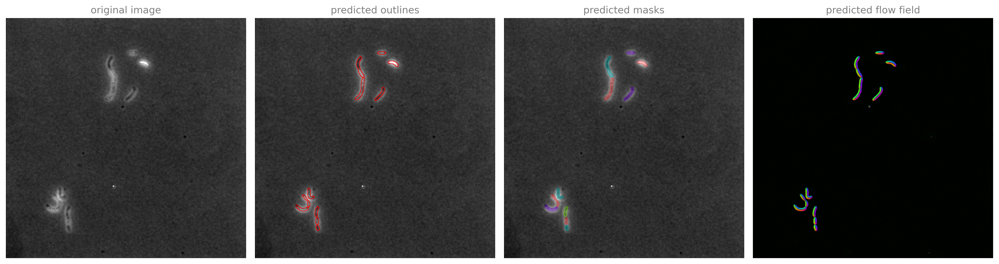

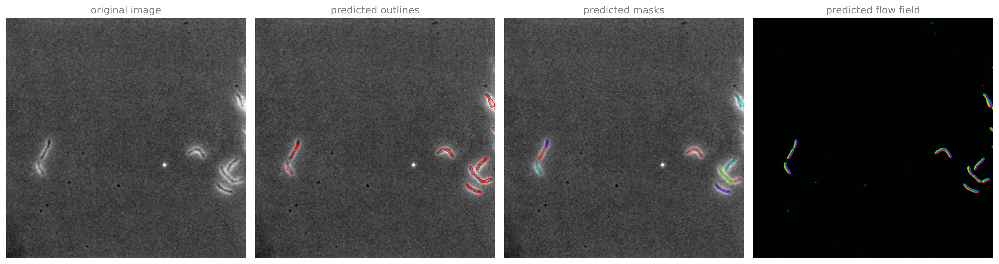

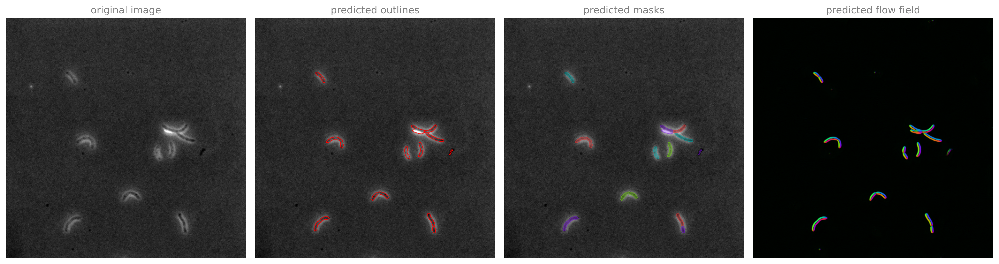

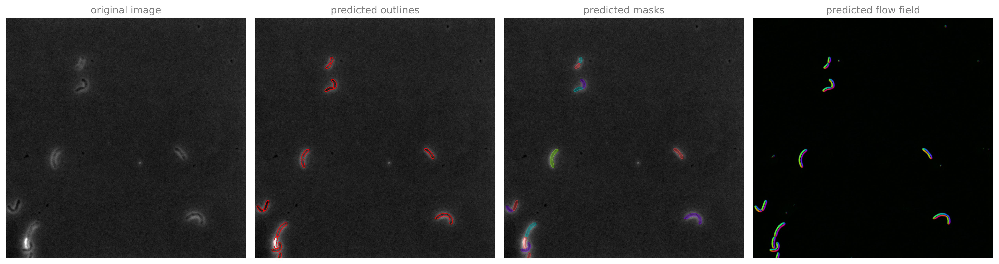

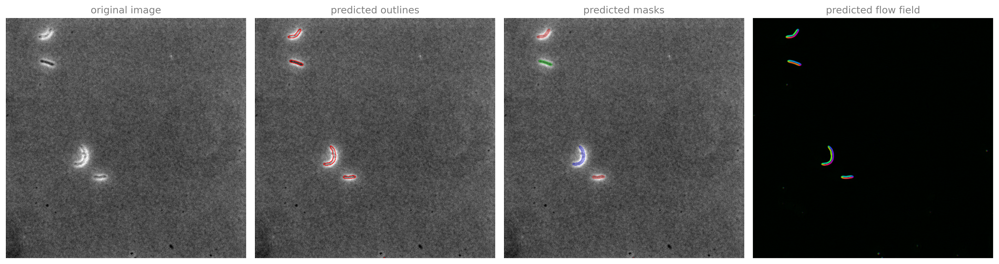

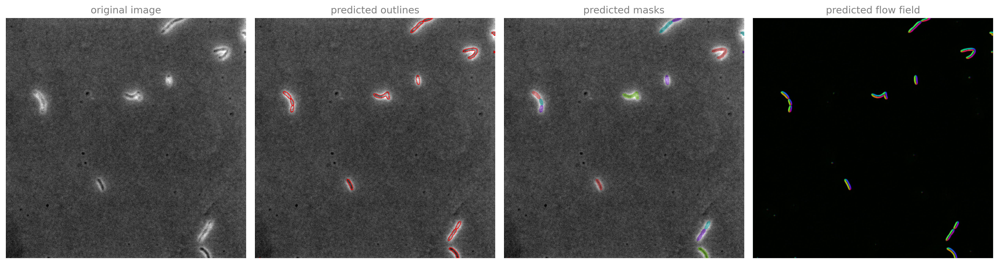

In [ ]:
from cellpose_omni import plot
import omnipose

for idx,i in enumerate(n):

    maski = masks[idx] # get masks
    bdi = flows[idx][-1] # get boundaries
    flowi = flows[idx][0] # get RGB flows 

    # set up the output figure to better match the resolution of the images 
    f = 10
    szX = maski.shape[-1]/mpl.rcParams['figure.dpi']*f
    szY = maski.shape[-2]/mpl.rcParams['figure.dpi']*f
    fig = plt.figure(figsize=(szY,szX*4))
    fig.patch.set_facecolor([0]*4)
    
    plot.show_segmentation(fig, omnipose.utils.normalize99(imgs[i]), 
                           maski, flowi, bdi, channels=chans, omni=True)

    plt.tight_layout()
    plt.show()